# Shape Detection

Classifies the outer shape (triangle/square/rectangle/circle/octagon) of the traffic sign detected in each of the 84 assignment-test images, as a diagnostic/exploration step - shape classification does not feed the classifiers in `03-classifier`.

This used to pull in `segment_red`/`segment_blue`/`segment_yellow` via a Jupyter `%run "Color Segmentation.ipynb"` magic (a working but fragile notebook-into-notebook import - only works inside a live Jupyter kernel with the right working directory). It now imports `pipeline.segmentation` directly, like every other stage.

In [1]:
import sys
from pathlib import Path

sys.path.insert(0, str(Path("..").resolve()))

import cv2
import matplotlib.pyplot as plt

from pipeline import annotations, segmentation, shapes

## Locate the 84 assignment-test images

In [2]:
held_out_filenames = annotations.held_out_filenames()

test_image_paths = sorted(
    p for p in annotations.list_dataset_images()
    if p.name.casefold() in {name.casefold() for name in held_out_filenames}
)

print(f"Test images found: {len(test_image_paths)} / {len(held_out_filenames)}")

Test images found: 84 / 84


## Segment, detect the best contour, and classify its shape

Image: 000_1_0002.png
Predicted: Unknown
Vertices: 10
Circularity: 0.699
Aspect Ratio: 0.918
--------------------------------------------------


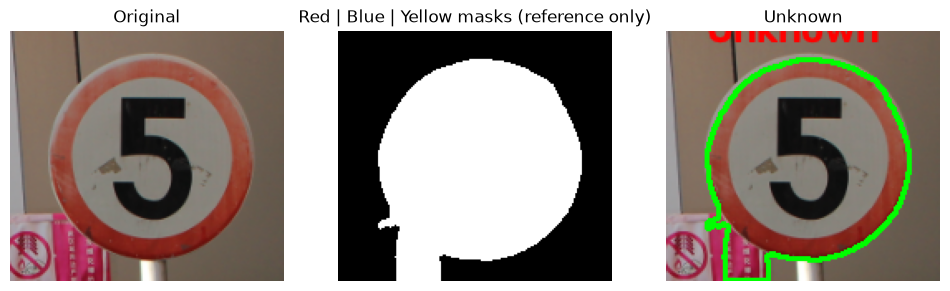

Image: 000_1_0013.png
Predicted: Circle
Vertices: 7
Circularity: 0.908
Aspect Ratio: 1.050
--------------------------------------------------


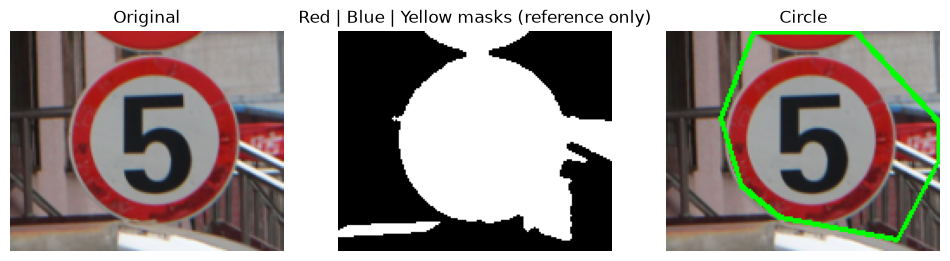

Image: 000_1_0018.png
Predicted: Circle
Vertices: 8
Circularity: 0.835
Aspect Ratio: 0.879
--------------------------------------------------


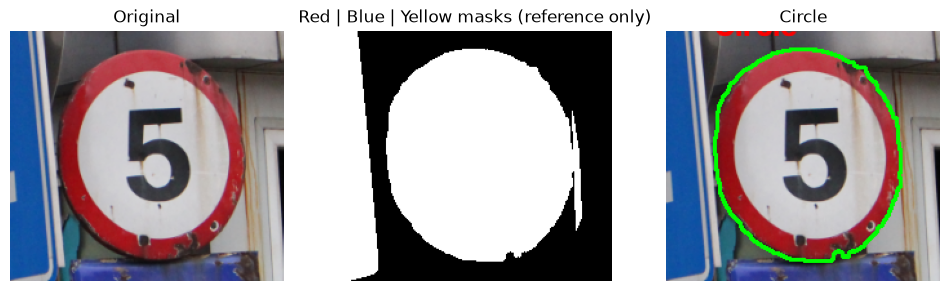

Image: 000_1_0034.png
Predicted: Circle
Vertices: 8
Circularity: 0.897
Aspect Ratio: 0.846
--------------------------------------------------


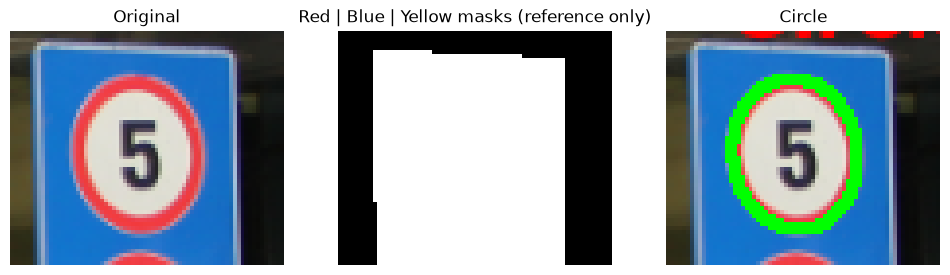

Image: 001_0004.png
Predicted: Circle
Vertices: 8
Circularity: 0.883
Aspect Ratio: 0.938
--------------------------------------------------


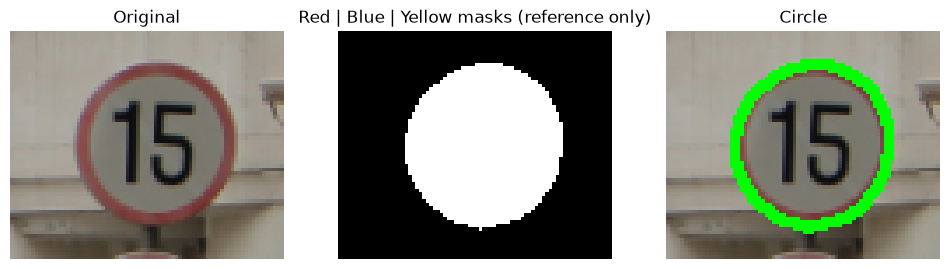

Image: 001_1_0009.png
Predicted: Circle
Vertices: 7
Circularity: 0.877
Aspect Ratio: 0.755
--------------------------------------------------


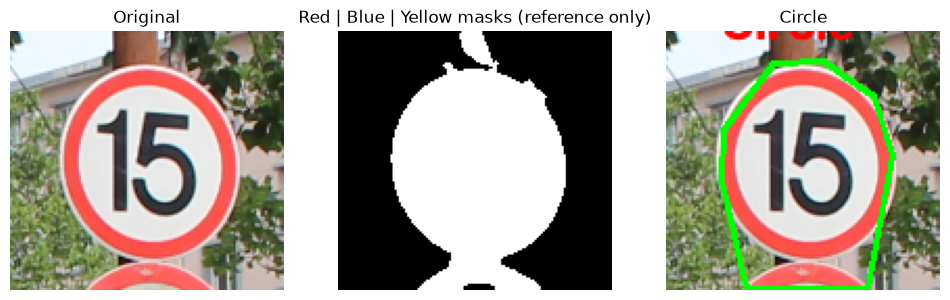

Image: 002_0036.png
Predicted: Circle
Vertices: 6
Circularity: 0.890
Aspect Ratio: 1.222
--------------------------------------------------


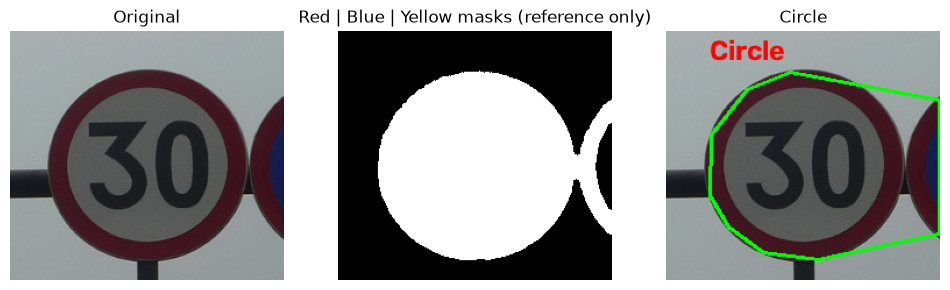

Image: 002_1_0010.png
Predicted: Circle
Vertices: 8
Circularity: 0.874
Aspect Ratio: 1.020
--------------------------------------------------


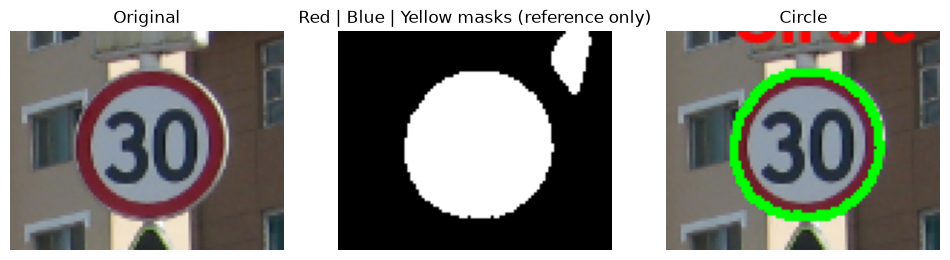

Image: 003_1_0034.png
Predicted: Circle
Vertices: 9
Circularity: 0.900
Aspect Ratio: 1.026
--------------------------------------------------


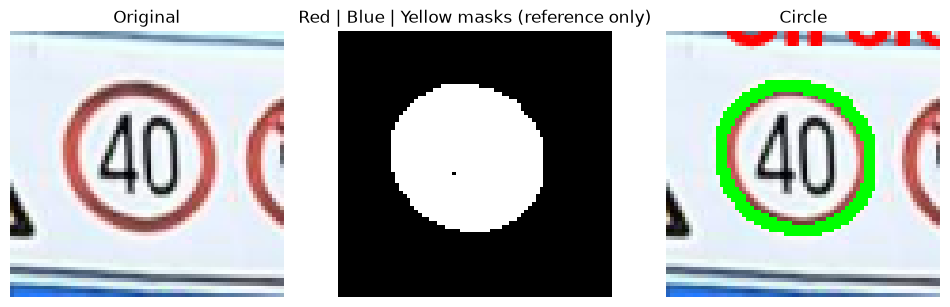

Image: 004_1_0020.png
Predicted: Circle
Vertices: 8
Circularity: 0.859
Aspect Ratio: 0.965
--------------------------------------------------


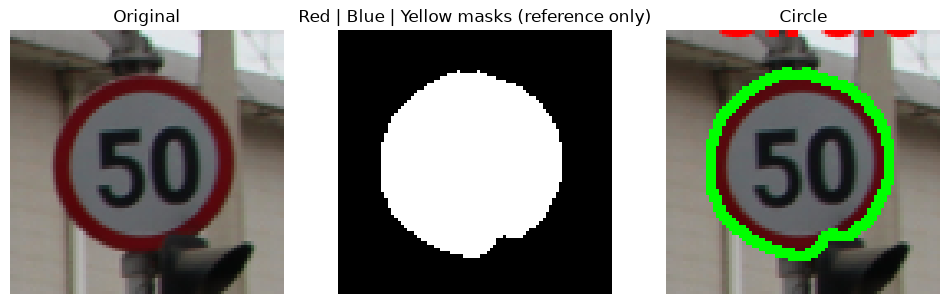

Image: 005_0030.png
Predicted: Unknown
Vertices: 6
Circularity: 0.819
Aspect Ratio: 1.244
--------------------------------------------------


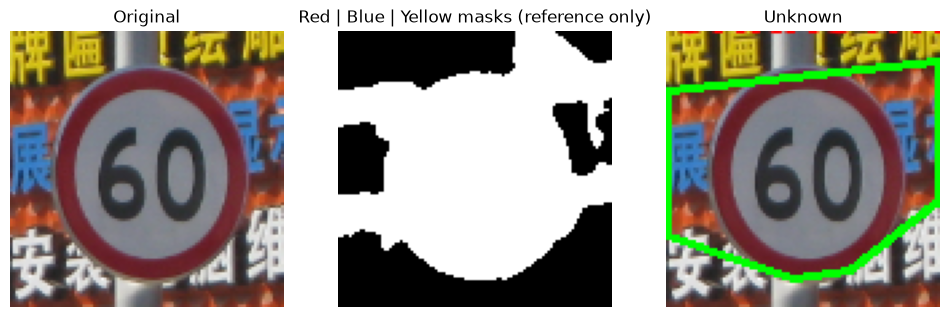

Image: 005_1_0027.png
Predicted: Circle
Vertices: 8
Circularity: 0.917
Aspect Ratio: 0.924
--------------------------------------------------


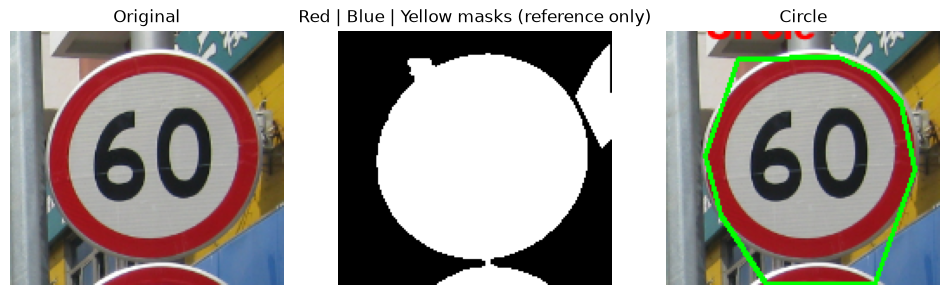

Image: 007_1_0006.png
Predicted: Circle
Vertices: 8
Circularity: 0.834
Aspect Ratio: 1.043
--------------------------------------------------


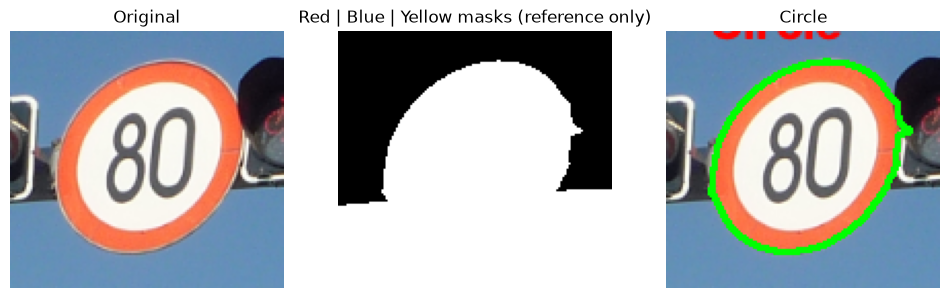

Image: 008_1_0008_1_j.png
Predicted: Circle
Vertices: 8
Circularity: 0.899
Aspect Ratio: 1.073
--------------------------------------------------


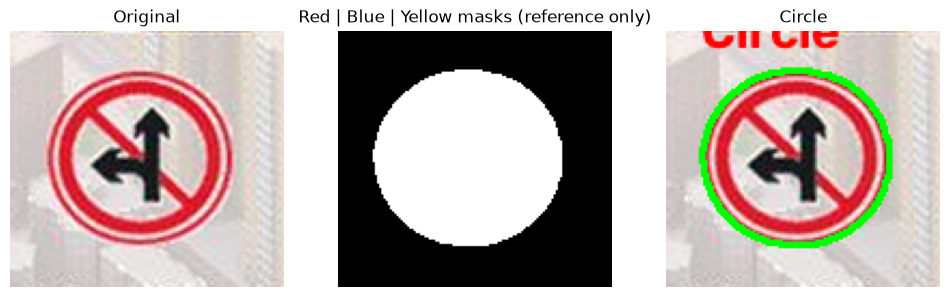

Image: 010_1_0013.png
Predicted: Circle
Vertices: 8
Circularity: 0.884
Aspect Ratio: 0.990
--------------------------------------------------


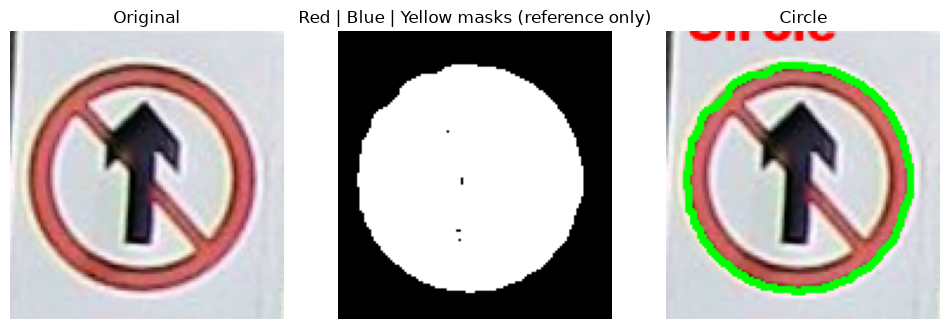

Image: 011_0029.png
Predicted: Circle
Vertices: 8
Circularity: 0.855
Aspect Ratio: 1.057
--------------------------------------------------


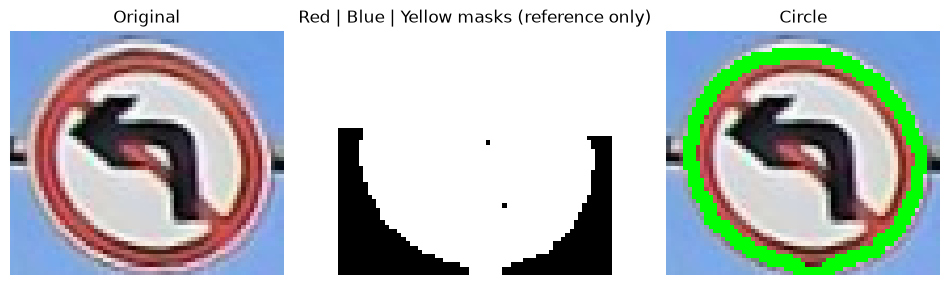

Image: 011_1_0019.png
Predicted: Circle
Vertices: 8
Circularity: 0.847
Aspect Ratio: 1.000
--------------------------------------------------


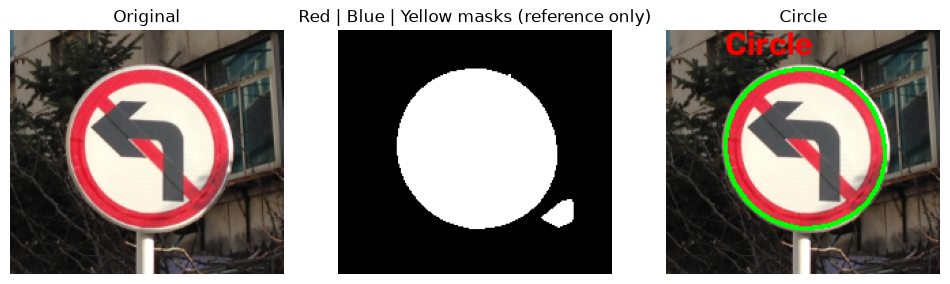

Image: 012_1_0015.png
Predicted: Circle
Vertices: 8
Circularity: 0.889
Aspect Ratio: 0.986
--------------------------------------------------


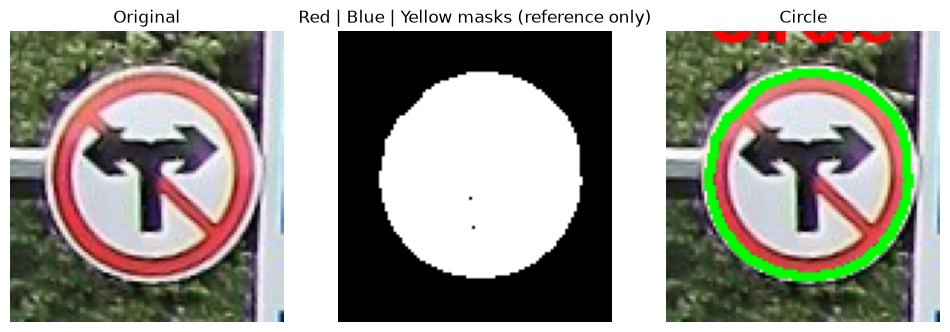

Image: 013_0013.png
Predicted: Circle
Vertices: 8
Circularity: 0.837
Aspect Ratio: 1.022
--------------------------------------------------


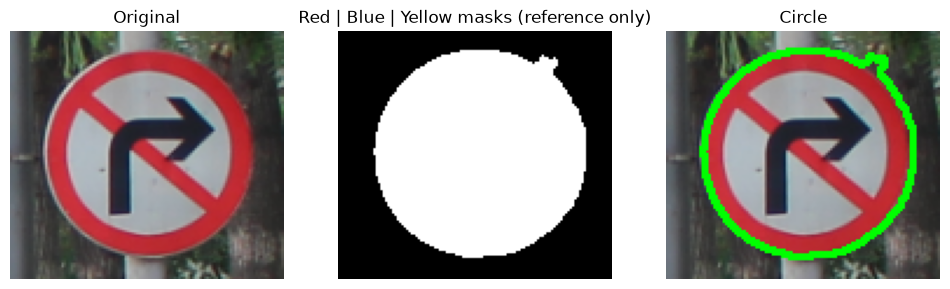

Image: 014_1_0028.png
Predicted: Circle
Vertices: 8
Circularity: 0.885
Aspect Ratio: 1.105
--------------------------------------------------


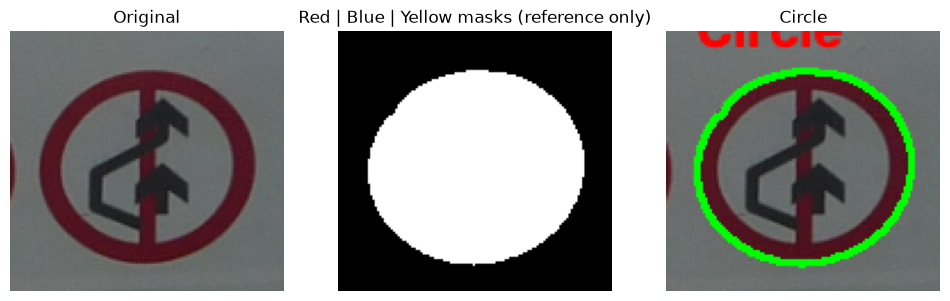

Image: 015_1_0001.png
Predicted: Circle
Vertices: 6
Circularity: 0.905
Aspect Ratio: 0.940
--------------------------------------------------


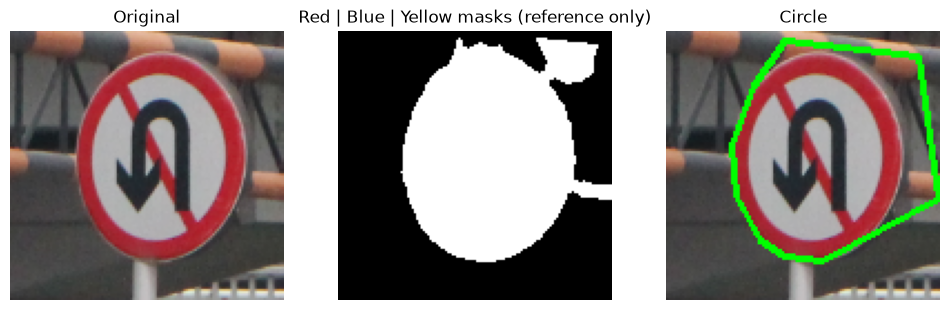

Image: 016_1_0014.png
Predicted: Circle
Vertices: 8
Circularity: 0.897
Aspect Ratio: 1.000
--------------------------------------------------


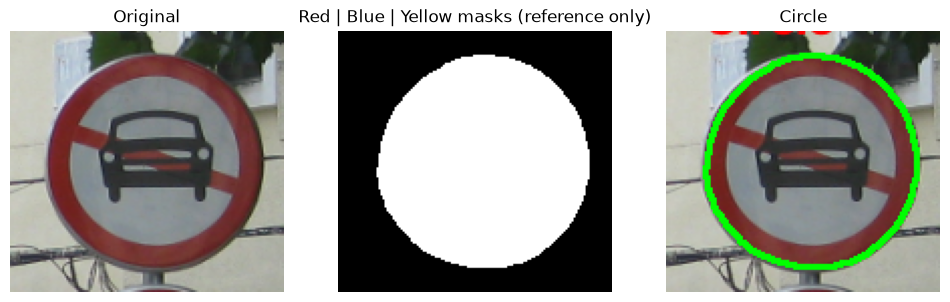

Image: 017_1_0017.png
Predicted: Circle
Vertices: 8
Circularity: 0.840
Aspect Ratio: 1.012
--------------------------------------------------


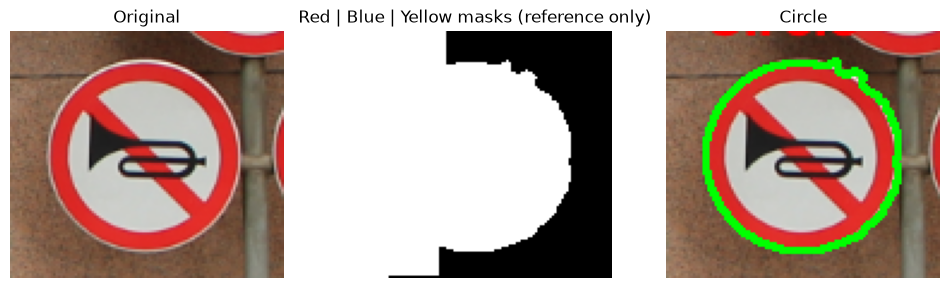

Image: 020_0002_j.png
Predicted: Unknown
Vertices: 10
Circularity: 0.706
Aspect Ratio: 0.594
--------------------------------------------------


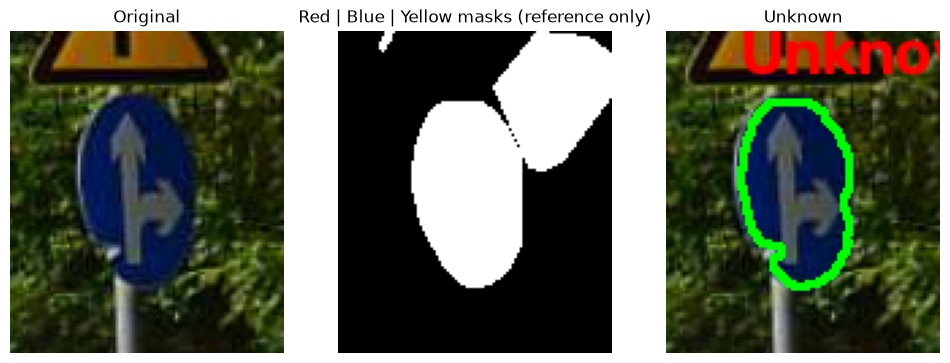

Image: 020_0003.png
Predicted: Circle
Vertices: 8
Circularity: 0.901
Aspect Ratio: 1.000
--------------------------------------------------


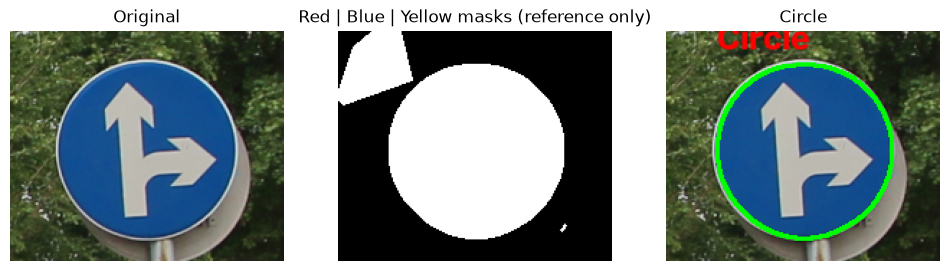

Image: 020_0004.png
Predicted: Circle
Vertices: 8
Circularity: 0.904
Aspect Ratio: 0.990
--------------------------------------------------


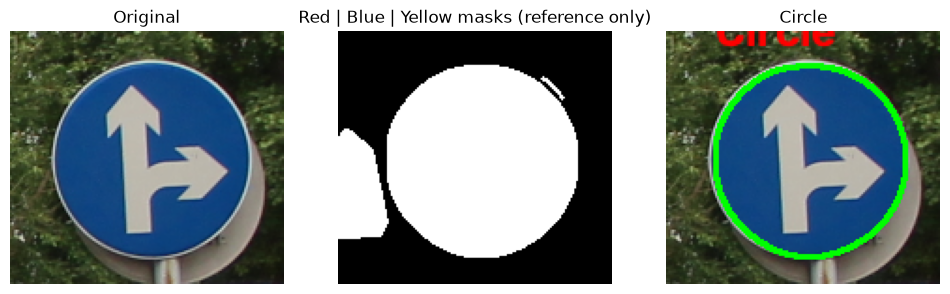

Image: 020_0006.png
Predicted: Circle
Vertices: 8
Circularity: 0.898
Aspect Ratio: 1.023
--------------------------------------------------


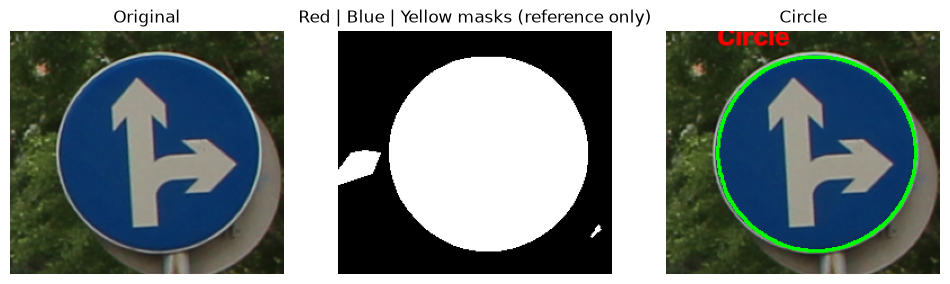

Image: 021_0002_j.png
Predicted: Octagon
Vertices: 8
Circularity: 0.756
Aspect Ratio: 1.149
--------------------------------------------------


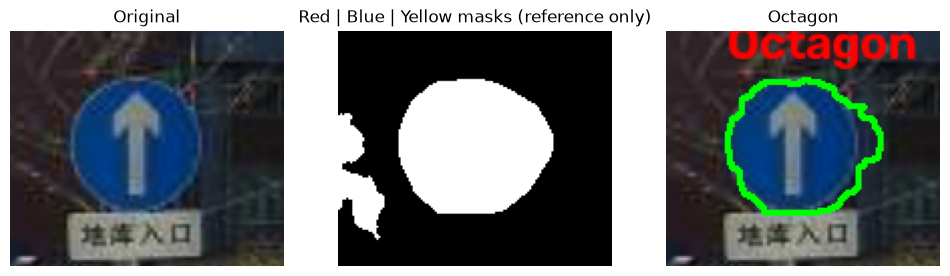

Image: 021_0003.png
Predicted: Circle
Vertices: 8
Circularity: 0.882
Aspect Ratio: 0.859
--------------------------------------------------


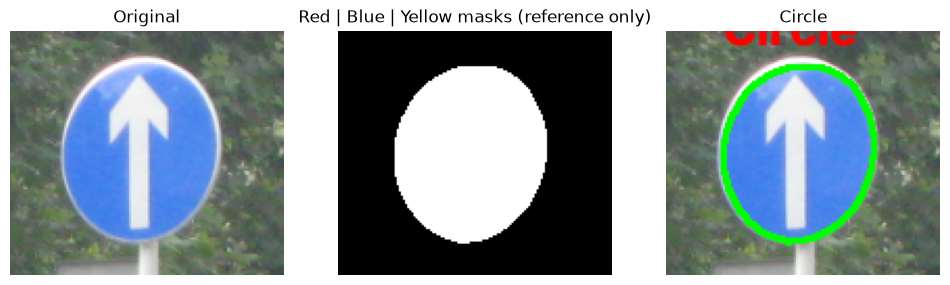

Image: 021_0004.png
Predicted: Circle
Vertices: 8
Circularity: 0.884
Aspect Ratio: 0.861
--------------------------------------------------


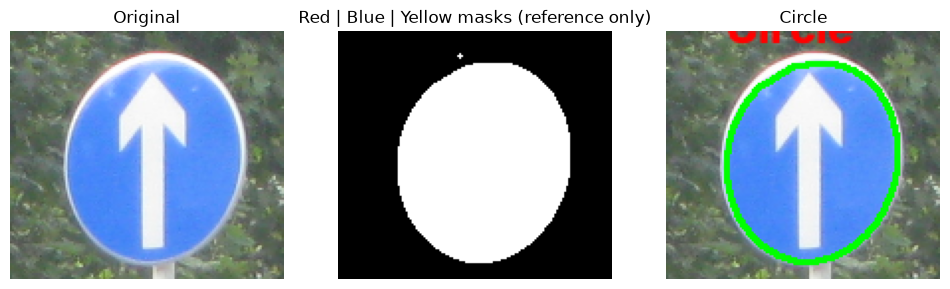

Image: 021_0004_j.png
Predicted: Circle
Vertices: 8
Circularity: 0.825
Aspect Ratio: 0.970
--------------------------------------------------


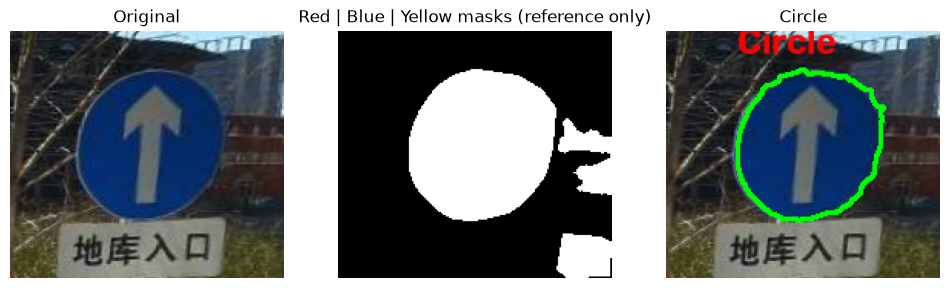

Image: 022_0005.png
Predicted: Circle
Vertices: 8
Circularity: 0.849
Aspect Ratio: 1.000
--------------------------------------------------


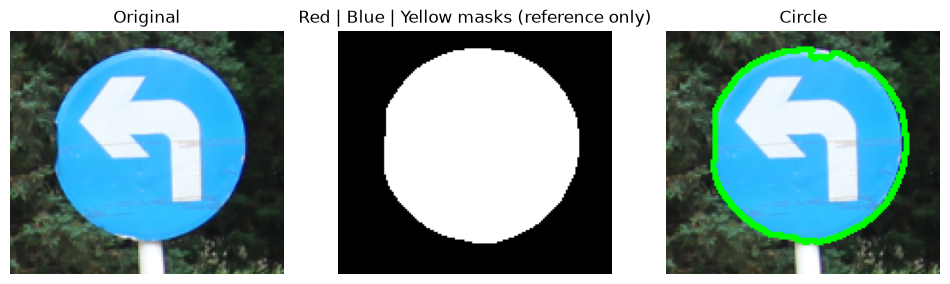

Image: 023_1_0002_1_j.png
Predicted: Circle
Vertices: 8
Circularity: 0.821
Aspect Ratio: 1.020
--------------------------------------------------


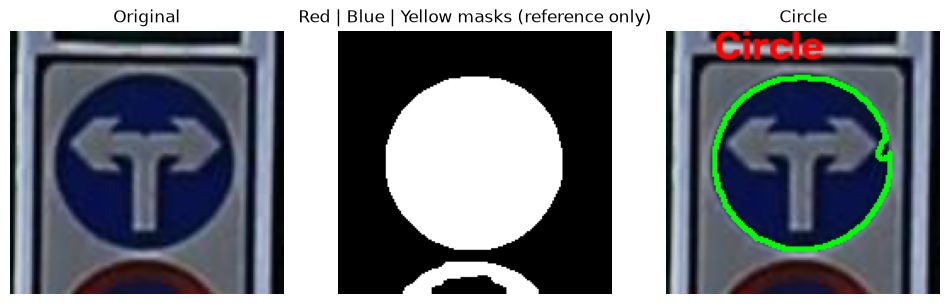

Image: 023_1_0003.png
Predicted: Circle
Vertices: 8
Circularity: 0.869
Aspect Ratio: 0.958
--------------------------------------------------


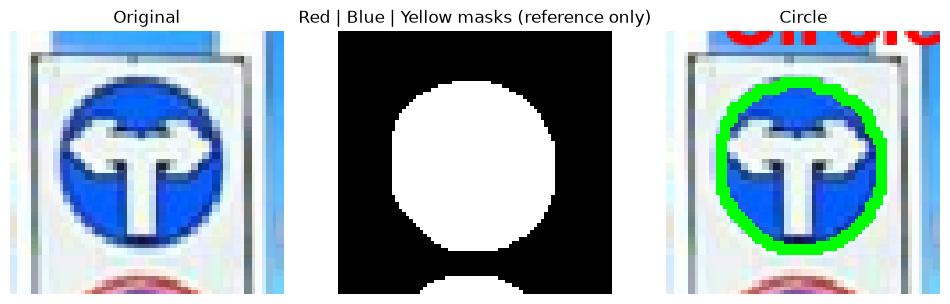

Image: 023_1_0004.png
Predicted: Circle
Vertices: 8
Circularity: 0.869
Aspect Ratio: 0.958
--------------------------------------------------


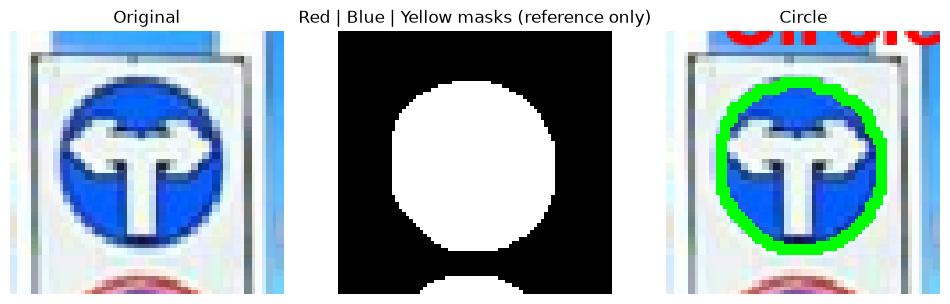

Image: 023_1_0005.png
Predicted: Circle
Vertices: 8
Circularity: 0.874
Aspect Ratio: 0.903
--------------------------------------------------


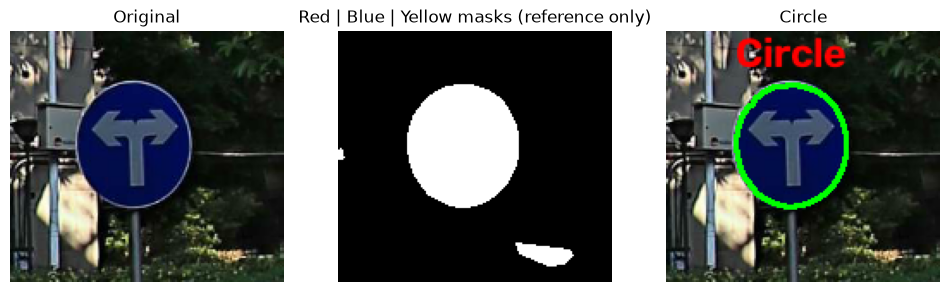

Image: 024_1_0016.png
Predicted: Unknown
Vertices: 11
Circularity: 0.669
Aspect Ratio: 1.030
--------------------------------------------------


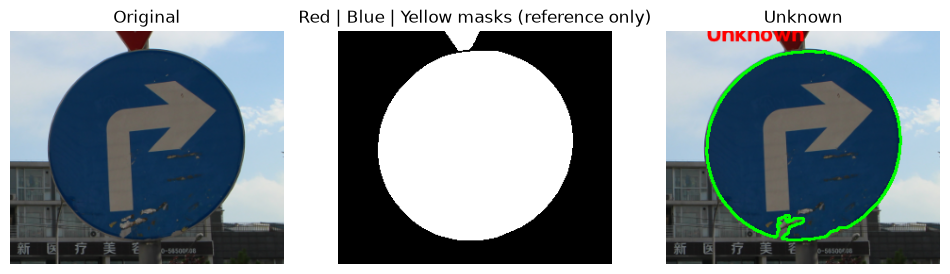

Image: 024_1_0017.png
Predicted: Unknown
Vertices: 11
Circularity: 0.701
Aspect Ratio: 1.034
--------------------------------------------------


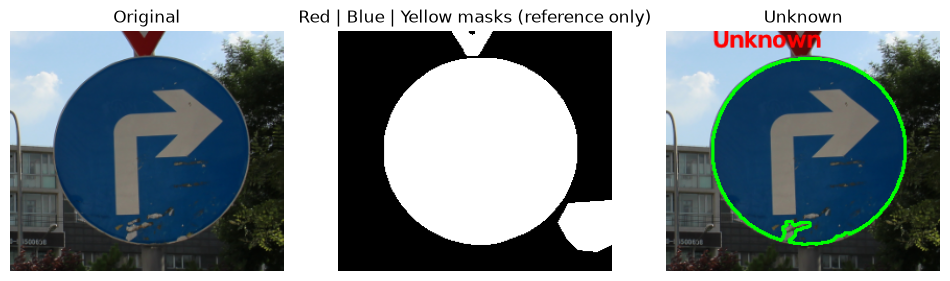

Image: 026_1_0016.png
Predicted: Circle
Vertices: 8
Circularity: 0.894
Aspect Ratio: 0.909
--------------------------------------------------


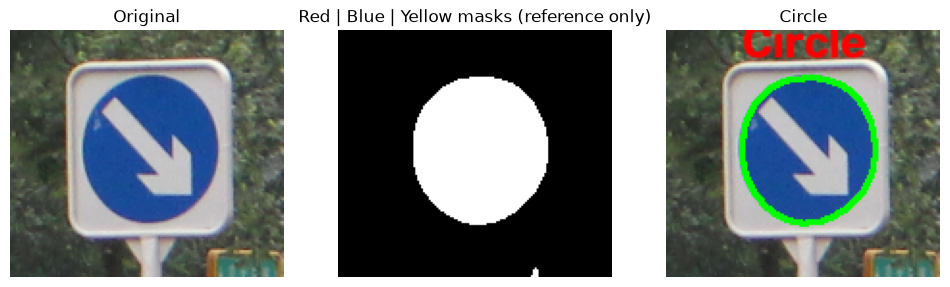

Image: 027_0002.png
Predicted: Circle
Vertices: 8
Circularity: 0.883
Aspect Ratio: 0.930
--------------------------------------------------


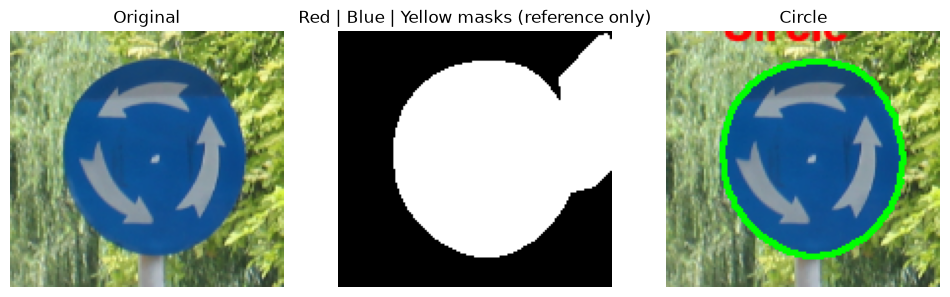

Image: 027_0010.png
Predicted: Circle
Vertices: 8
Circularity: 0.906
Aspect Ratio: 0.984
--------------------------------------------------


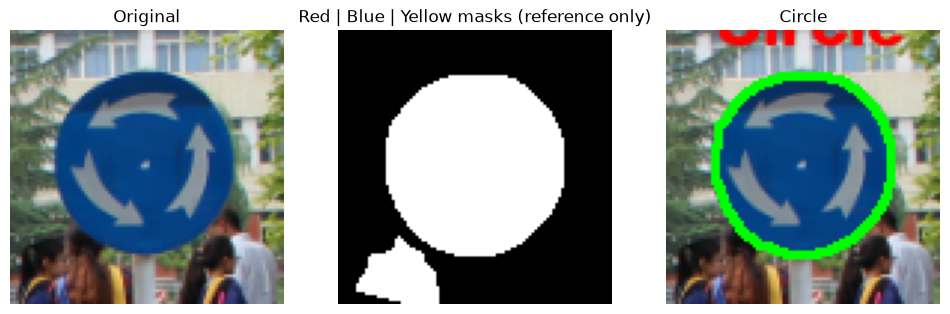

Image: 027_0012.png
Predicted: Octagon
Vertices: 8
Circularity: 0.791
Aspect Ratio: 1.016
--------------------------------------------------


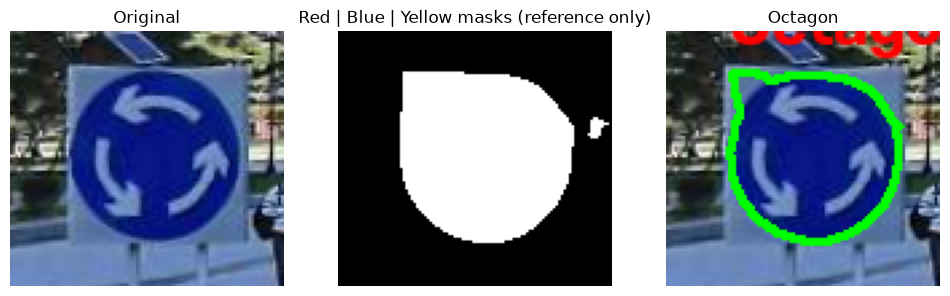

Image: 028_0202.png
Predicted: Circle
Vertices: 8
Circularity: 0.892
Aspect Ratio: 0.964
--------------------------------------------------


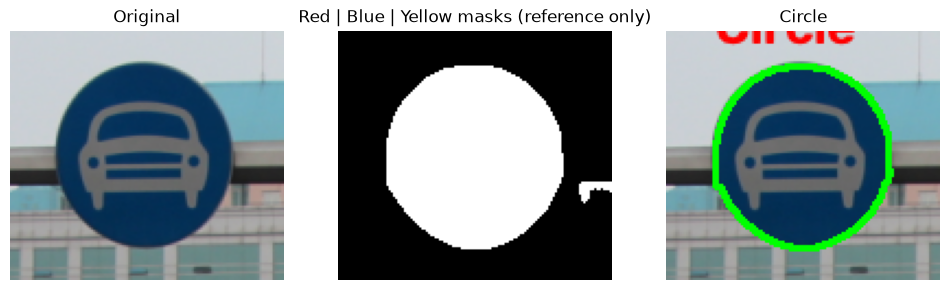

Image: 028_1_0007.png
Predicted: Circle
Vertices: 8
Circularity: 0.898
Aspect Ratio: 1.009
--------------------------------------------------


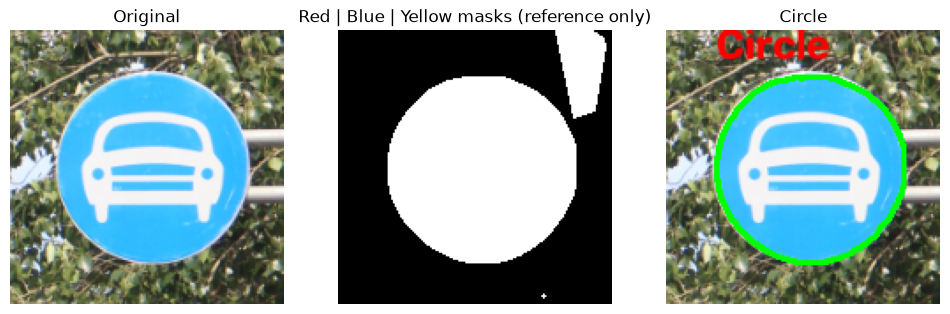

Image: 028_1_0216.png
Predicted: Circle
Vertices: 8
Circularity: 0.899
Aspect Ratio: 1.009
--------------------------------------------------


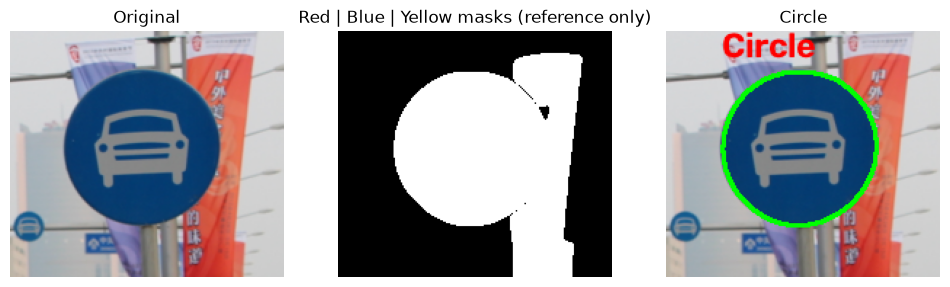

Image: 029_1_0015.png
Predicted: Circle
Vertices: 8
Circularity: 0.902
Aspect Ratio: 1.009
--------------------------------------------------


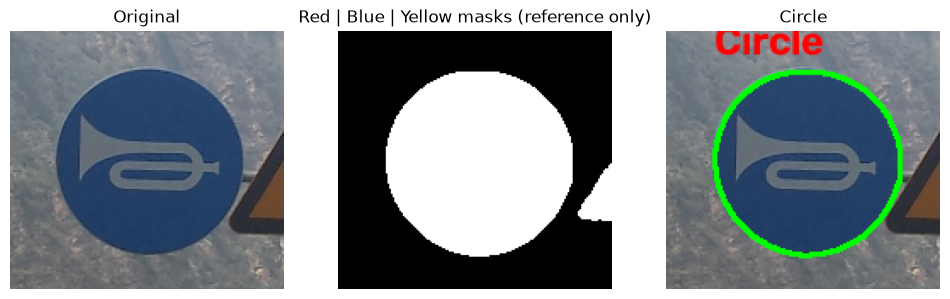

Image: 030_1_0002.png
Predicted: Circle
Vertices: 8
Circularity: 0.871
Aspect Ratio: 1.040
--------------------------------------------------


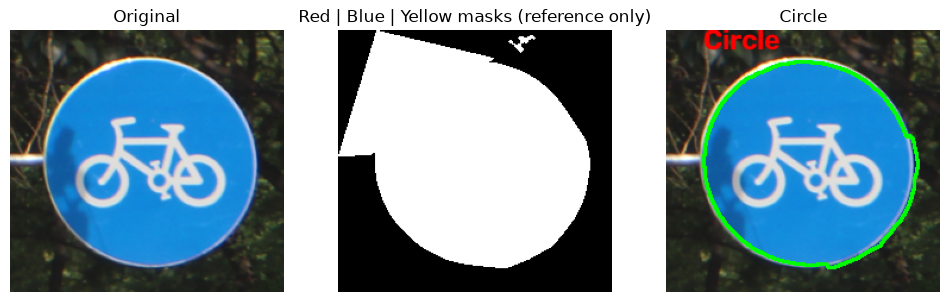

Image: 030_1_0018_1_j.png
Predicted: Circle
Vertices: 8
Circularity: 0.895
Aspect Ratio: 1.080
--------------------------------------------------


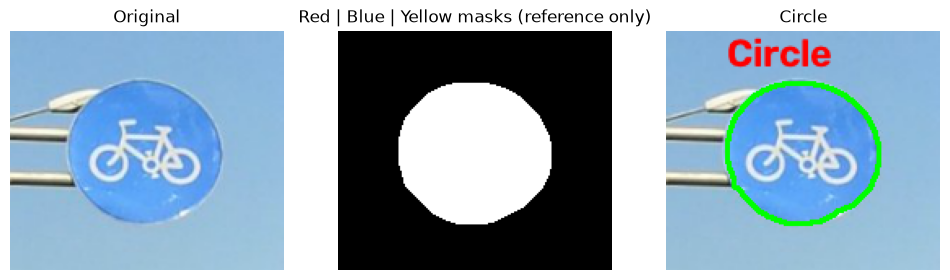

Image: 030_1_0023.png
Predicted: Circle
Vertices: 8
Circularity: 0.891
Aspect Ratio: 0.845
--------------------------------------------------


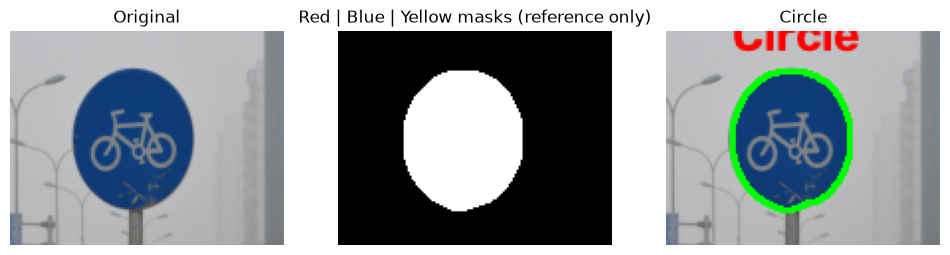

Image: 031_0011.png
Predicted: Square
Vertices: 4
Circularity: 0.789
Aspect Ratio: 0.977
--------------------------------------------------


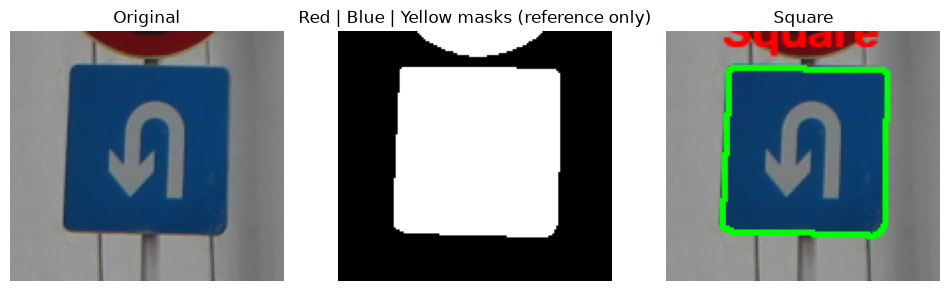

Image: 031_1_0020.png
Predicted: Rectangle
Vertices: 4
Circularity: 0.779
Aspect Ratio: 0.843
--------------------------------------------------


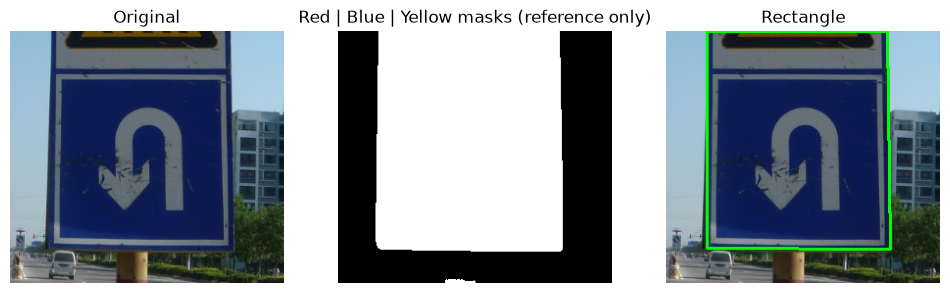

Image: 032_1_0001_1_j.png
Predicted: Unknown
Vertices: 5
Circularity: 0.584
Aspect Ratio: 1.018
--------------------------------------------------


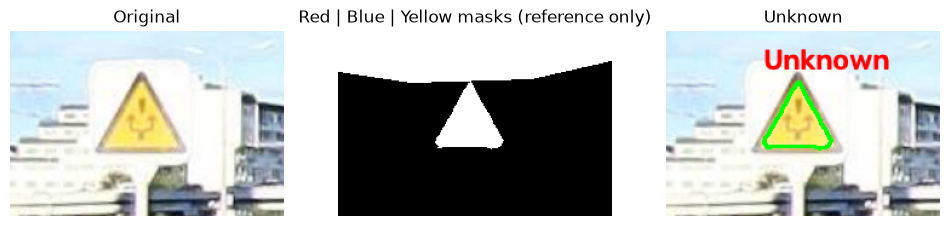

Image: 032_1_0002_1_j.png
Predicted: Triangle
Vertices: 3
Circularity: 0.533
Aspect Ratio: 0.827
--------------------------------------------------


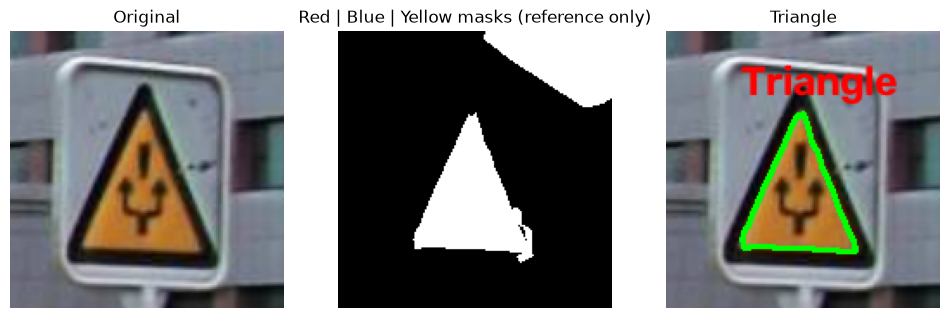

Image: 033_1_0001.png
Predicted: Rectangle
Vertices: 4
Circularity: 0.594
Aspect Ratio: 1.108
--------------------------------------------------


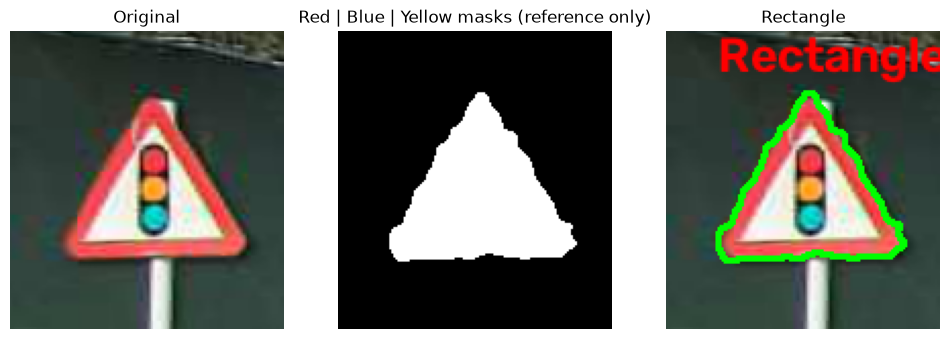

Image: 034_1_0002.png
Predicted: Triangle
Vertices: 3
Circularity: 0.549
Aspect Ratio: 1.188
--------------------------------------------------


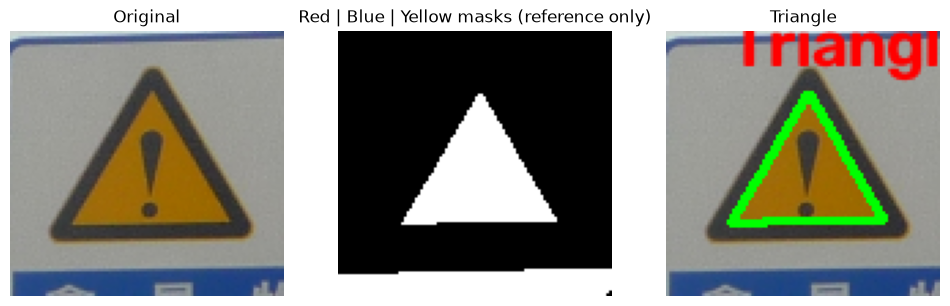

Image: 034_1_0003_1_j.png
Predicted: Square
Vertices: 4
Circularity: 0.799
Aspect Ratio: 1.000
--------------------------------------------------


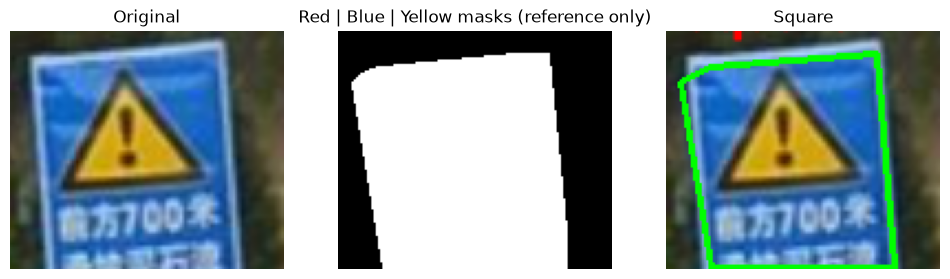

Image: 035_1_0002.png
Predicted: Triangle
Vertices: 3
Circularity: 0.546
Aspect Ratio: 1.104
--------------------------------------------------


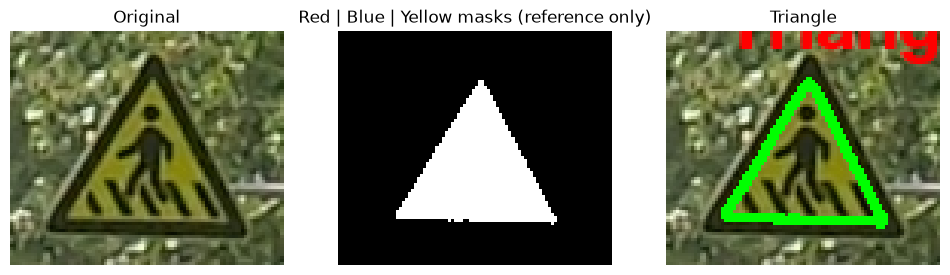

Image: 035_1_0003.png
Predicted: Triangle
Vertices: 3
Circularity: 0.553
Aspect Ratio: 1.146
--------------------------------------------------


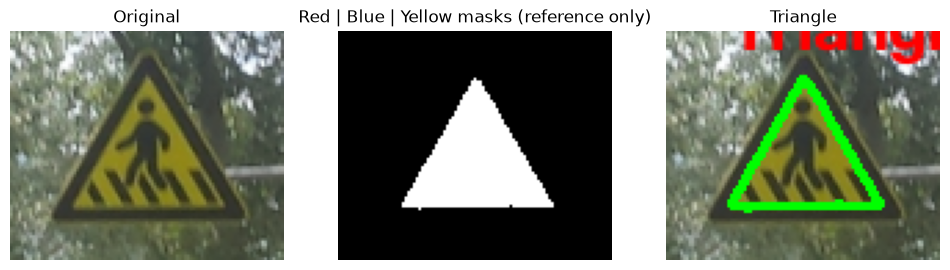

Image: 035_1_0004.png
Predicted: Triangle
Vertices: 3
Circularity: 0.555
Aspect Ratio: 1.177
--------------------------------------------------


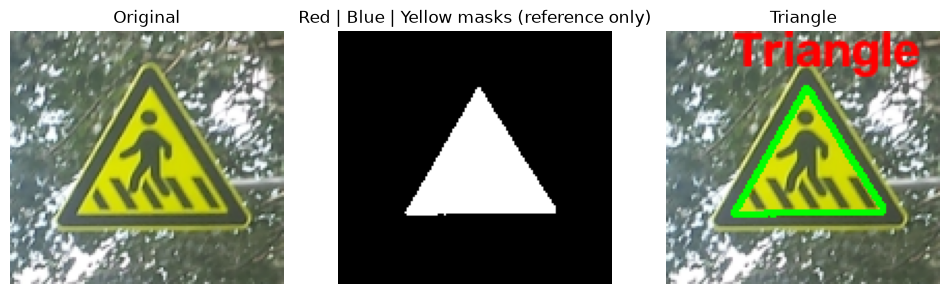

Image: 036_1_0014.png
Predicted: Triangle
Vertices: 3
Circularity: 0.553
Aspect Ratio: 1.189
--------------------------------------------------


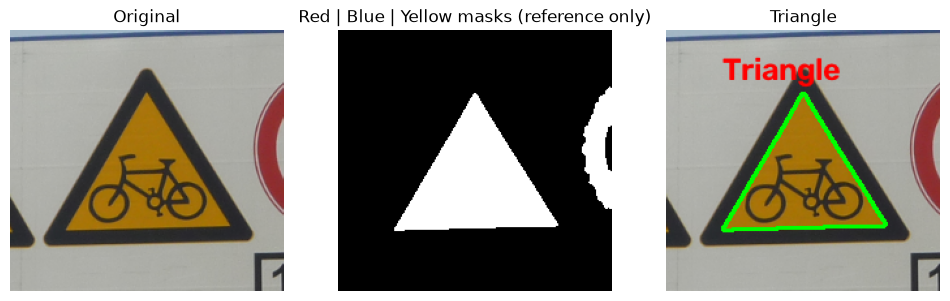

Image: 036_1_0016.png
Predicted: Triangle
Vertices: 3
Circularity: 0.543
Aspect Ratio: 1.152
--------------------------------------------------


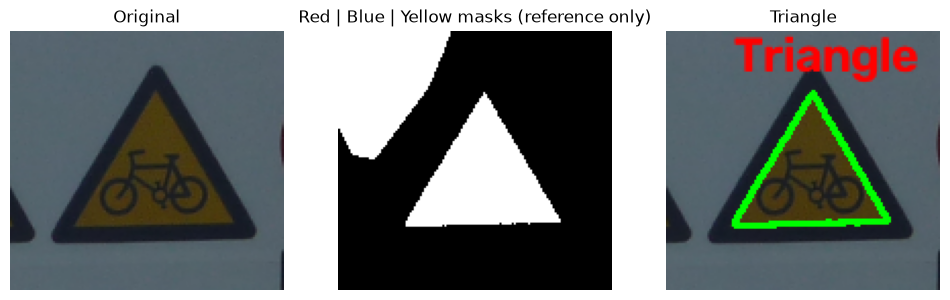

Image: 036_1_0019.png
Predicted: Triangle
Vertices: 3
Circularity: 0.520
Aspect Ratio: 1.135
--------------------------------------------------


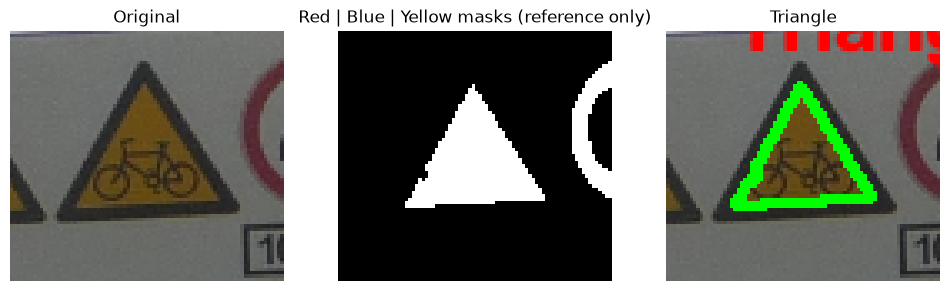

Image: 037_0019.png
Predicted: Triangle
Vertices: 3
Circularity: 0.549
Aspect Ratio: 1.133
--------------------------------------------------


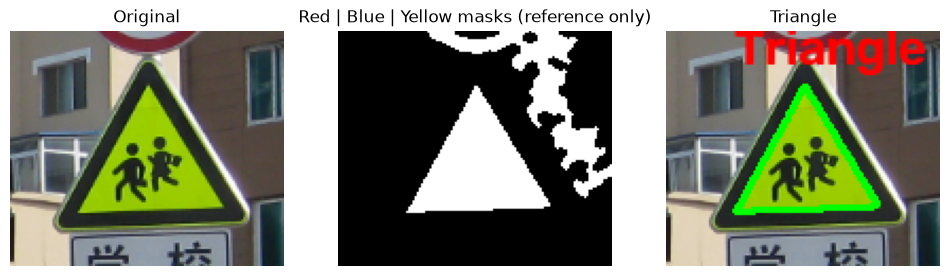

Image: 037_0021.png
Predicted: Triangle
Vertices: 3
Circularity: 0.554
Aspect Ratio: 1.018
--------------------------------------------------


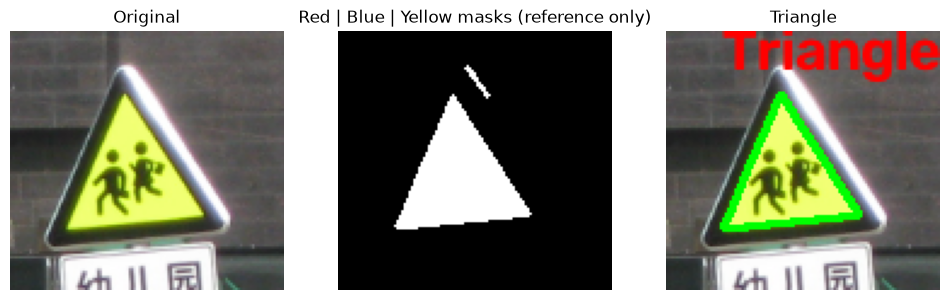

Image: 037_1_0009.png
Predicted: Triangle
Vertices: 3
Circularity: 0.535
Aspect Ratio: 1.000
--------------------------------------------------


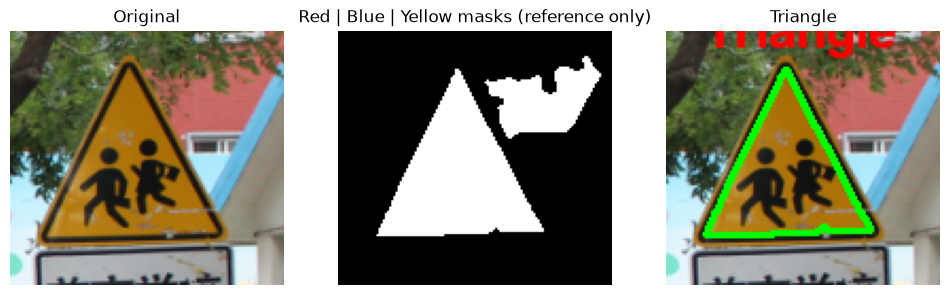

Image: 038_0008.png
Predicted: Triangle
Vertices: 3
Circularity: 0.542
Aspect Ratio: 1.082
--------------------------------------------------


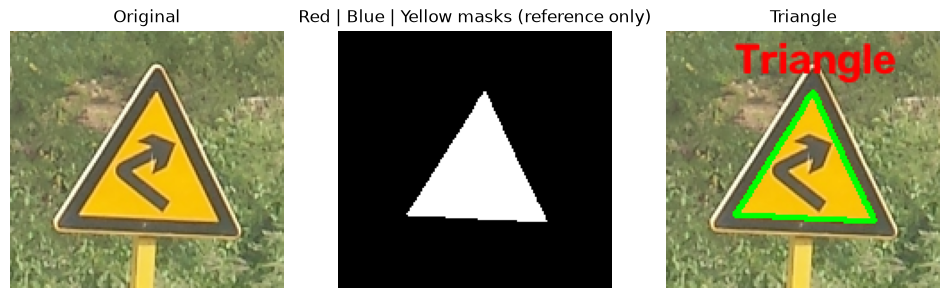

Image: 040_0011.png
Predicted: Unknown
Vertices: 5
Circularity: 0.695
Aspect Ratio: 0.614
--------------------------------------------------


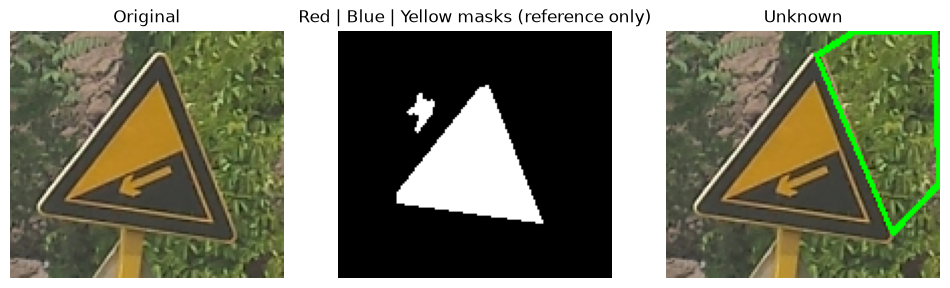

Image: 042_0002_j.png
Predicted: Triangle
Vertices: 3
Circularity: 0.554
Aspect Ratio: 1.067
--------------------------------------------------


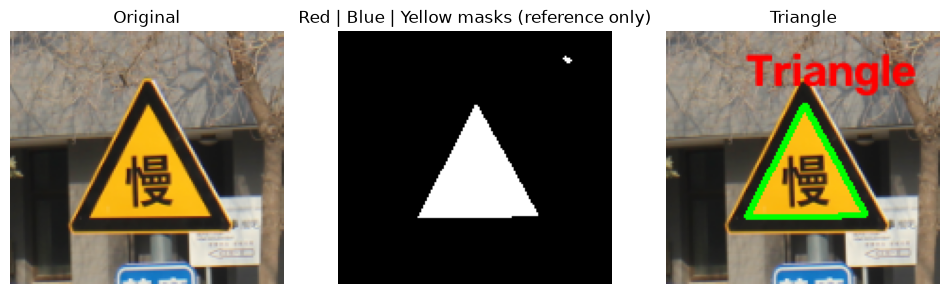

Image: 042_0016_j.png
Predicted: Triangle
Vertices: 3
Circularity: 0.568
Aspect Ratio: 1.170
--------------------------------------------------


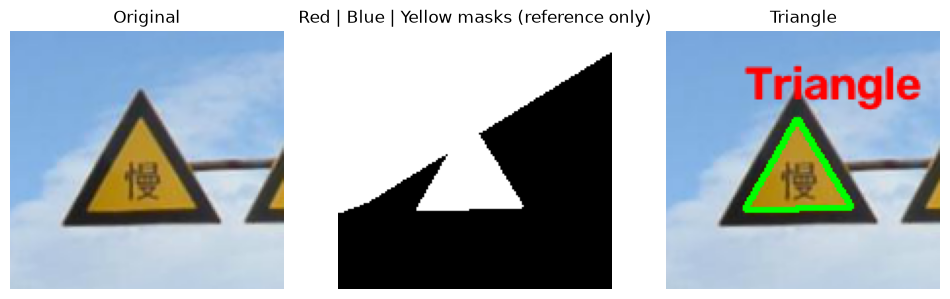

Image: 043_1_0021.png
Predicted: Triangle
Vertices: 3
Circularity: 0.540
Aspect Ratio: 1.125
--------------------------------------------------


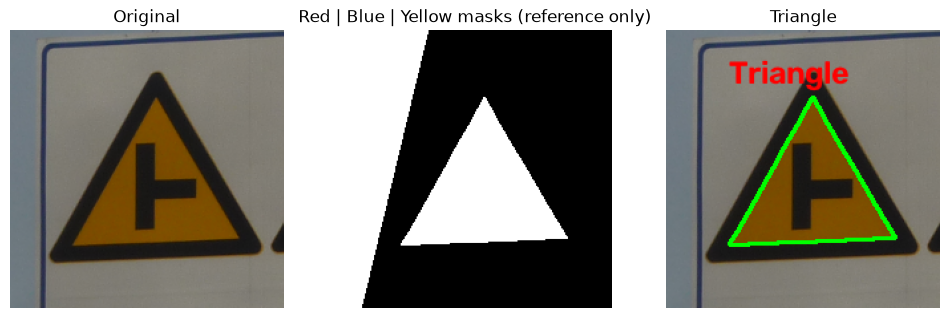

Image: 045_1_0004.png
Predicted: Unknown
Vertices: 5
Circularity: 0.813
Aspect Ratio: 1.028
--------------------------------------------------


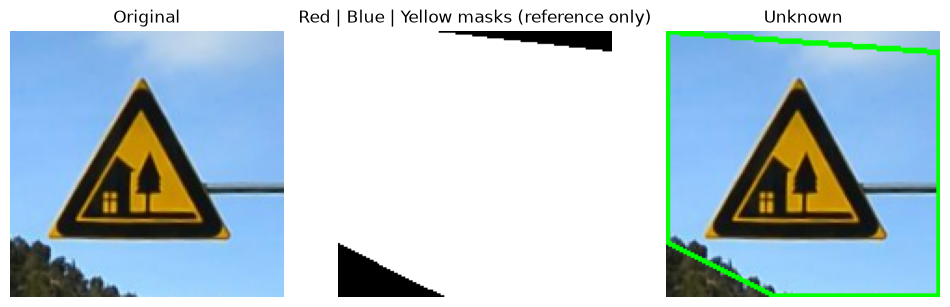

Image: 045_1_0009.png
Predicted: Rectangle
Vertices: 4
Circularity: 0.745
Aspect Ratio: 1.567
--------------------------------------------------


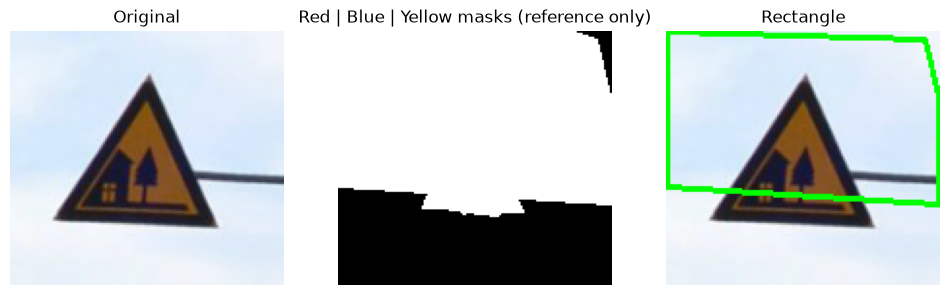

Image: 046_0005_j.png
Predicted: Triangle
Vertices: 3
Circularity: 0.571
Aspect Ratio: 1.125
--------------------------------------------------


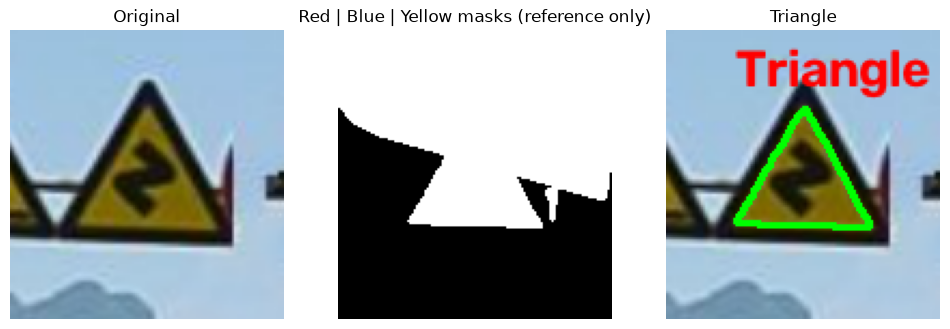

Image: 047_0002.png
Predicted: Triangle
Vertices: 3
Circularity: 0.553
Aspect Ratio: 1.170
--------------------------------------------------


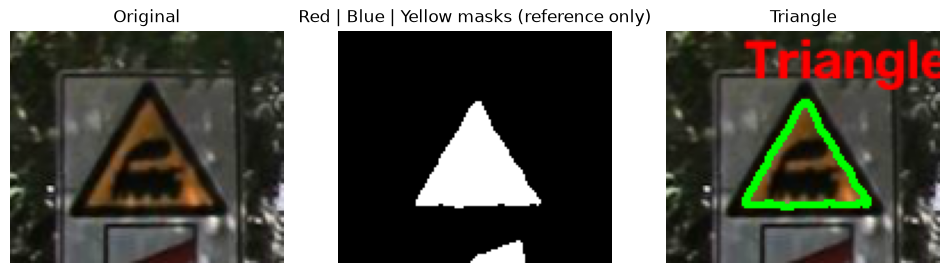

Image: 047_0005.png
Predicted: Triangle
Vertices: 3
Circularity: 0.545
Aspect Ratio: 1.037
--------------------------------------------------


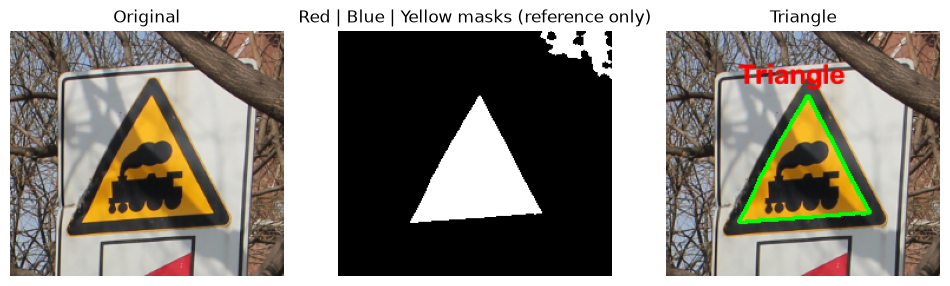

Image: 047_1_0003.png
Predicted: Triangle
Vertices: 3
Circularity: 0.553
Aspect Ratio: 1.170
--------------------------------------------------


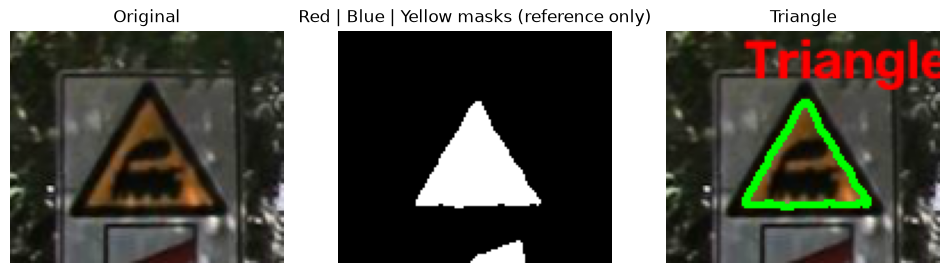

Image: 048_0004.png
Predicted: Rectangle
Vertices: 4
Circularity: 0.517
Aspect Ratio: 1.350
--------------------------------------------------


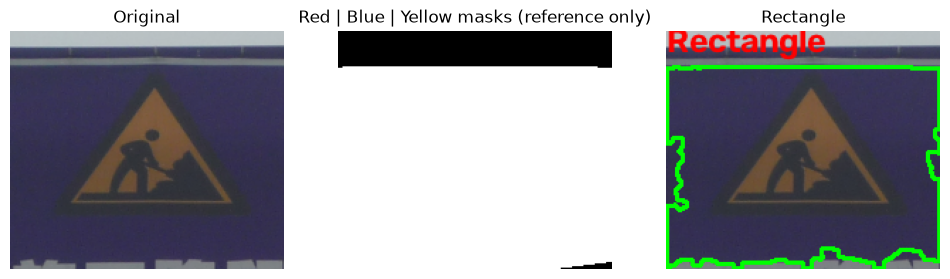

Image: 049_1_0010.png
Predicted: Rectangle
Vertices: 4
Circularity: 0.503
Aspect Ratio: 1.156
--------------------------------------------------


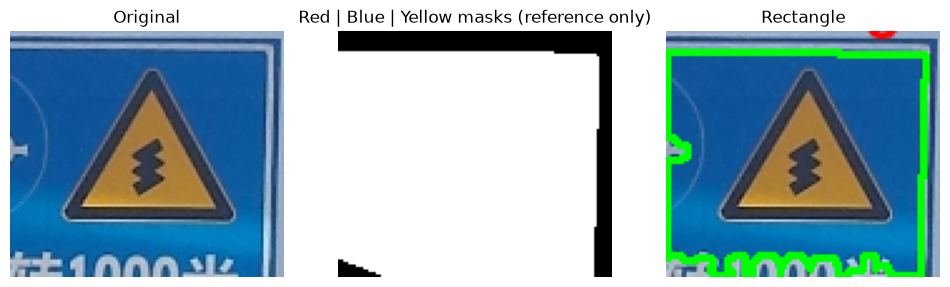

Image: 050_1_0003.png
Predicted: Triangle
Vertices: 3
Circularity: 0.530
Aspect Ratio: 1.000
--------------------------------------------------


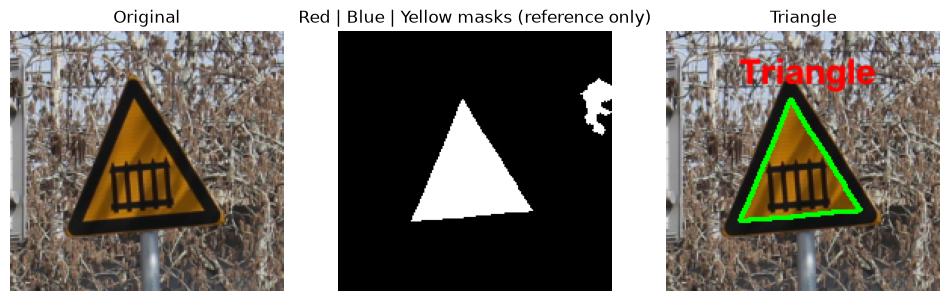

Image: 051_0005_j.png
Predicted: Rectangle
Vertices: 4
Circularity: 0.801
Aspect Ratio: 0.806
--------------------------------------------------


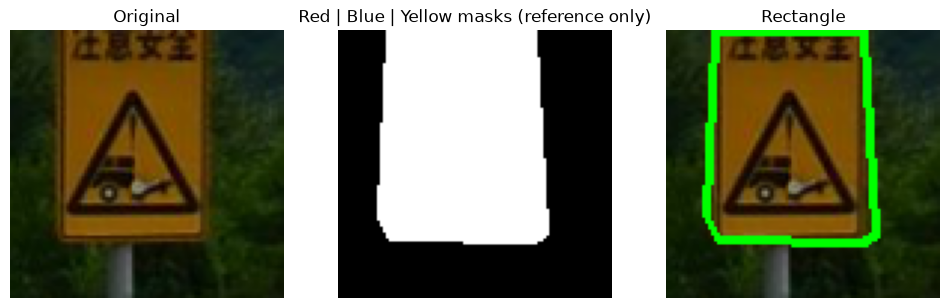

Image: 052_1_0008_1_j.png
Predicted: Circle
Vertices: 8
Circularity: 0.865
Aspect Ratio: 0.979
--------------------------------------------------


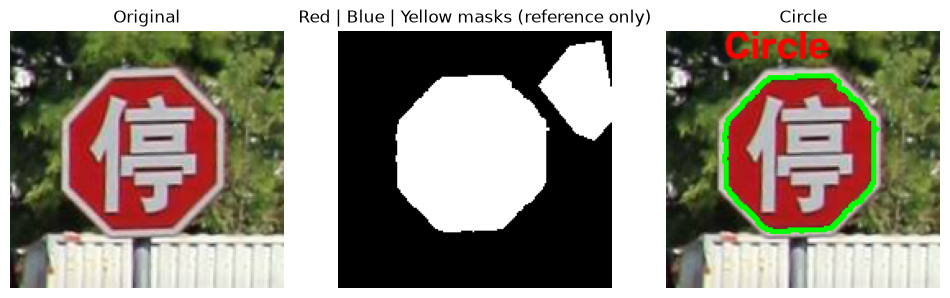

Image: 055_1_0031.png
Predicted: Circle
Vertices: 8
Circularity: 0.897
Aspect Ratio: 0.895
--------------------------------------------------


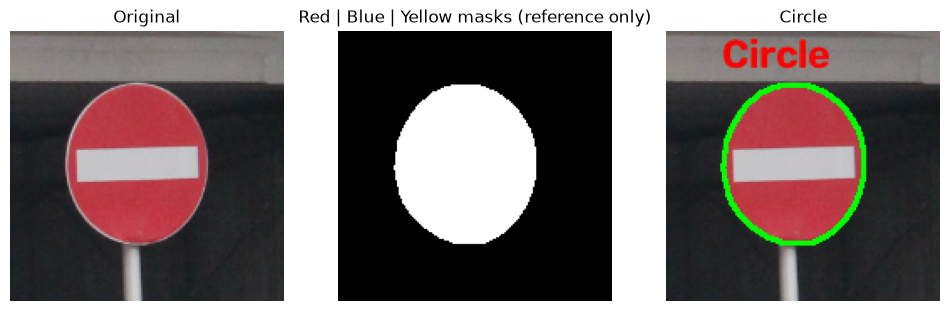

Image: 056_1_0010.png
Predicted: Triangle
Vertices: 3
Circularity: 0.598
Aspect Ratio: 1.197
--------------------------------------------------


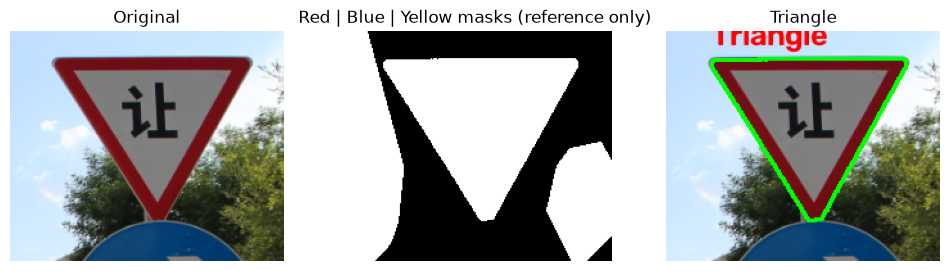

Image: 057_0003_j.png
Predicted: Circle
Vertices: 8
Circularity: 0.862
Aspect Ratio: 0.933
--------------------------------------------------


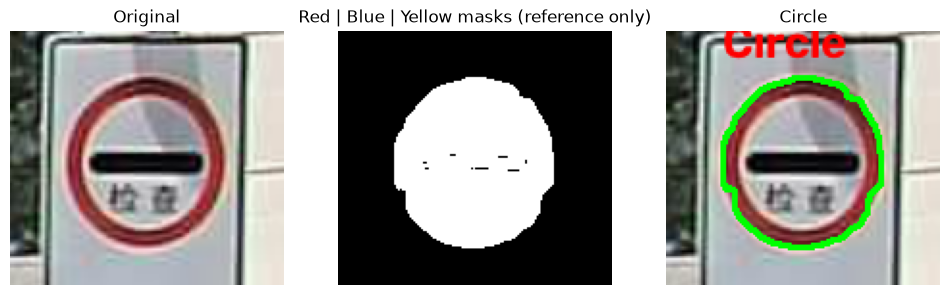

Shape counts: {'Unknown': 8, 'Circle': 45, 'Octagon': 2, 'Square': 2, 'Rectangle': 6, 'Triangle': 21}
Undetected: 0 / 84


In [3]:
shape_counts = {}
undetected = 0

for image_path in test_image_paths:
    filename = image_path.name

    img = cv2.imread(str(image_path))
    if img is None:
        continue

    img_rgb, hsv = shapes.preprocess_image(img)

    # The true sign color is not known ahead of time. Score red/blue/yellow's
    # own best candidate contour separately and pick the winner across
    # colours, rather than OR-ing all three masks into one first.
    red_mask = segmentation.segment_red(img)
    blue_mask = segmentation.segment_blue(img)
    yellow_mask = segmentation.segment_yellow(img)
    mask = red_mask | blue_mask | yellow_mask

    best_contour = segmentation.select_best_contour_multi_colour(img)

    if best_contour is None:
        print(f"{filename}: No traffic sign detected.")
        undetected += 1
        continue

    features = shapes.extract_features(best_contour)
    shape = shapes.classify_shape(features)
    shape_counts[shape] = shape_counts.get(shape, 0) + 1

    print(f"Image: {filename}")
    print(f"Predicted: {shape}")
    print(f"Vertices: {features['vertices']}")
    print(f"Circularity: {features['circularity']:.3f}")
    print(f"Aspect Ratio: {features['aspect_ratio']:.3f}")
    print("-" * 50)

    result = shapes.draw_result(img_rgb, best_contour, shape, features["bounding_box"])

    fig, ax = plt.subplots(1, 3, figsize=(12, 5))
    ax[0].imshow(img_rgb)
    ax[0].set_title("Original")
    ax[1].imshow(mask, cmap="gray")
    ax[1].set_title("Red | Blue | Yellow masks (reference only)")
    ax[2].imshow(result)
    ax[2].set_title(shape)
    for a in ax:
        a.axis("off")
    plt.show()

print("Shape counts:", shape_counts)
print("Undetected:", undetected, "/", len(test_image_paths))